<a href="https://colab.research.google.com/github/plaban1981/Hugging_Face_transformers_topics/blob/main/pix2struct.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install git+https://github.com/huggingface/transformers.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-o5rd1ox2
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-o5rd1ox2
  Resolved https://github.com/huggingface/transformers.git to commit 0fe6c6bdca79cab648c84e0d605469c8456e02ce
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 51.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 199.8/199.8 KB 22.4 MB/s eta 0:00:00
  Created wheel for transformers: filename=transformers-4.28.0.dev0-py3-none-any.whl size=6857696 sha256=eaf88b81c7424e3542a88e60f295757be92b38f2a0a85a837797499e4d9e50b3
  Stored in directory: /tmp/pip-ephem-wheel-cache-4bs61v9h/wheels/f7/92/8c/752ff3bfcd3439805d8bbf641614da3

* need transformers==4.28.0.dev0 for this

In [2]:
import transformers
transformers.__version__

'4.28.0.dev0'

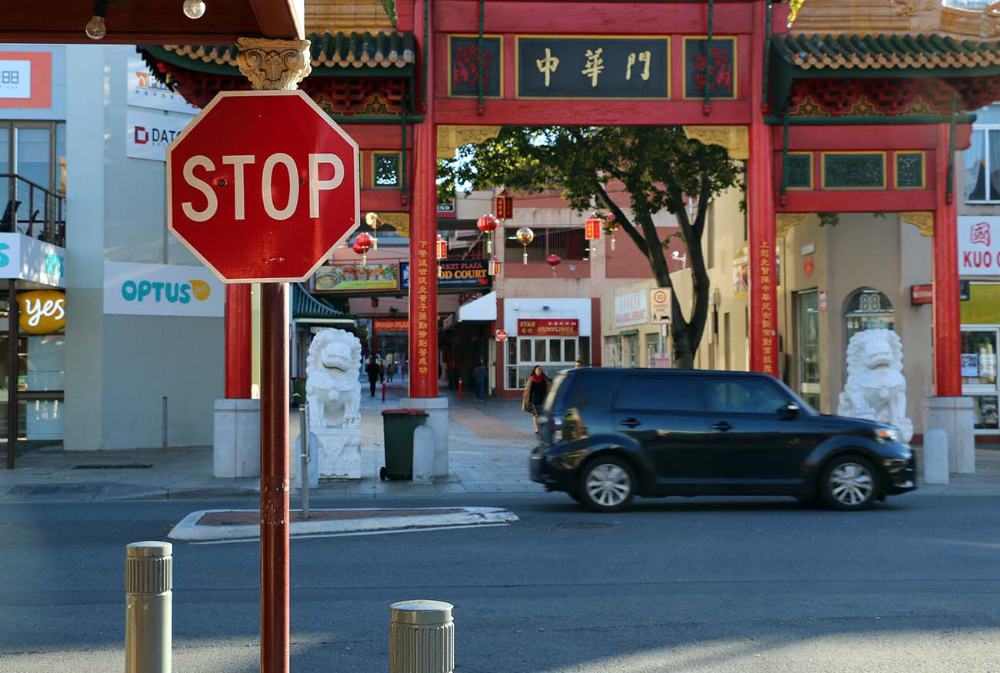

In [ ]:
import requests
from PIL import Image
from transformers import Pix2StructForConditionalGeneration, Pix2StructProcessor


url = "https://www.ilankelman.org/stopsigns/australia.jpg"
image = Image.open(requests.get(url, stream=True).raw)

image

In [ ]:
model = Pix2StructForConditionalGeneration.from_pretrained("google/pix2struct-textcaps-base")
processor = Pix2StructProcessor.from_pretrained("google/pix2struct-textcaps-base")

# image only
inputs = processor(images=image, return_tensors="pt")

predictions = model.generate(**inputs)
print(processor.decode(predictions[0], skip_special_tokens=True))

A decoder-only architecture is being used, but right-padding was detected! For correct generation results, please set `padding_side='left'` when initializing the tokenizer.
/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1298: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


A stop sign is on a street corner.


In [ ]:
conditional_text = "A stop sign board"
inputs = processor(images=image, text=conditional_text, return_tensors="pt", add_special_tokens=True)
#
predictions = model.generate(**inputs)
print(processor.decode(predictions[0], skip_special_tokens=True))

A stop sign board is in front of a store.


## Image2 


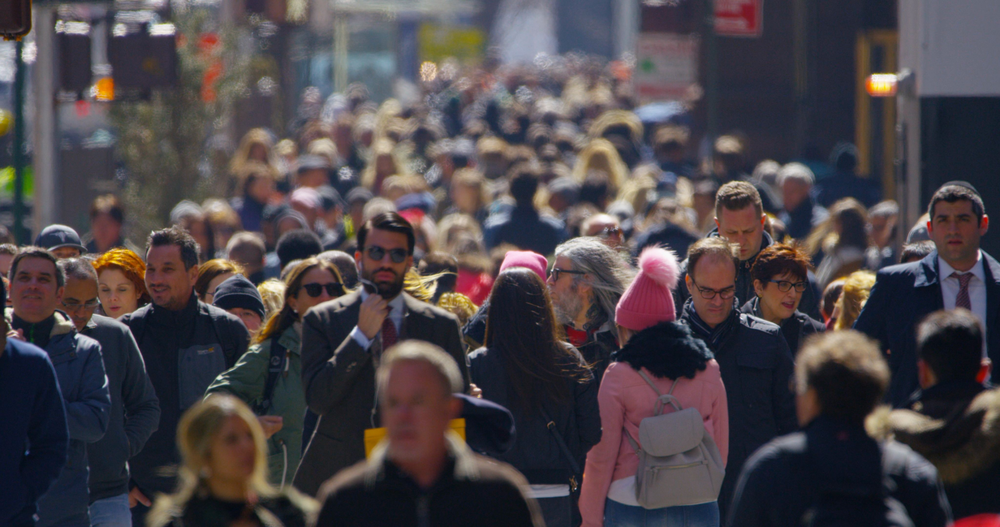

In [ ]:

url = "https://i.pinimg.com/originals/74/10/1f/74101f337a707c0136844998d17a499f.jpg"
image = Image.open(requests.get(url, stream=True).raw)

image

In [ ]:
# image only
inputs = processor(images=image, return_tensors="pt")

predictions = model.generate(**inputs)
print(processor.decode(predictions[0], skip_special_tokens=True))

A decoder-only architecture is being used, but right-padding was detected! For correct generation results, please set `padding_side='left'` when initializing the tokenizer.
/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1298: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


A group of people are standing in front of a large crowd of people.


## With Conditional Text for Conditional generation
You can also pre-pend some input text to perform conditional generation:

In [ ]:
#
conditional_text = "A man with balck suit"
#
inputs = processor(images=image, text=conditional_text, return_tensors="pt", add_special_tokens=True,max_length=60,truncation=True)
#
predictions = model.generate(**inputs)
print(processor.decode(predictions[0], skip_special_tokens=True))

/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1298: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


A man with balck suits shirt standing in front of a crowd of people.


## Image3

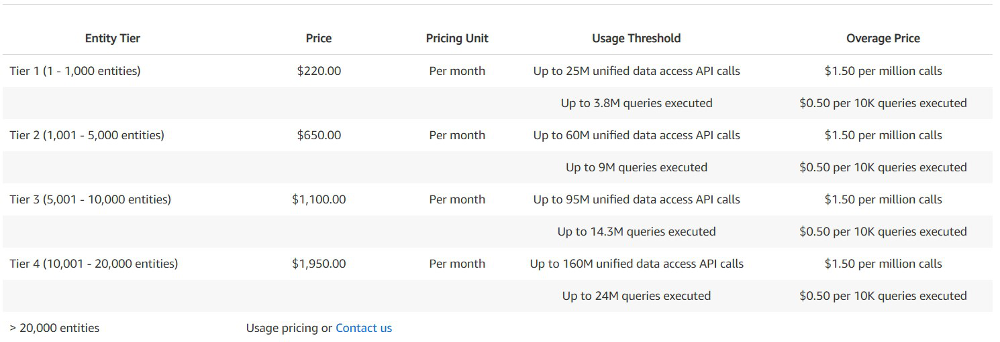

In [6]:
from PIL import Image
image3 = "/content/Pricing.jpg"
image3 = Image.open(image3)
#
image3

In [ ]:
# image only
conditional_text = "cloud pricing tier"
#
inputs = processor(images=image, text=conditional_text, return_tensors="pt", add_special_tokens=True,max_length=60,truncation=True)
#
predictions = model.generate(**inputs)
print(processor.decode(predictions[0], skip_special_tokens=True))

cloud pricing tier 10k


## Images 4

In [ ]:
# image only
conditional_text = "A picture of food"
inputs = processor(images=image, text=conditional_text, return_tensors="pt", add_special_tokens=True,max_length=200,truncation=True)
#
predictions = model.generate(**inputs)
print(processor.decode(predictions[0], skip_special_tokens=True))

A picture of food with a food chain song written on it.


## Document Visual Question Answering

In [1]:
from transformers import Pix2StructForConditionalGeneration, Pix2StructProcessor

In [2]:
model = Pix2StructForConditionalGeneration.from_pretrained("google/pix2struct-docvqa-large")
processor = Pix2StructProcessor.from_pretrained("google/pix2struct-docvqa-large")

def process_document(image, question):
    # image = Image.open(image)
    inputs = processor(images=image, text=question, return_tensors="pt")
    predictions = model.generate(**inputs)
    return processor.decode(predictions[0], skip_special_tokens=True)

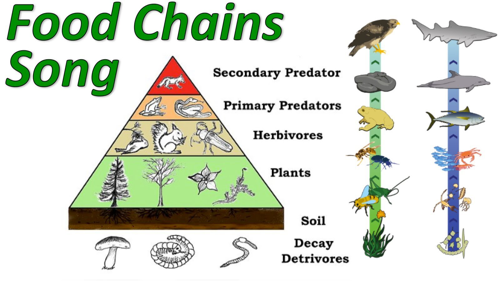

In [9]:
from PIL import Image
from IPython.display import clear_output, display
image4 = "/content/food chain.jpg"
image4 = Image.open(image4)
#
thumb = image4.copy()
thumb.thumbnail([500, 500])
display(thumb)

## Ask questin based on the image supplied

In [10]:
question ="Who is at the top in the food chain ?"
process_document(image4,question)

A decoder-only architecture is being used, but right-padding was detected! For correct generation results, please set `padding_side='left'` when initializing the tokenizer.
/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


'Secondary Predator'

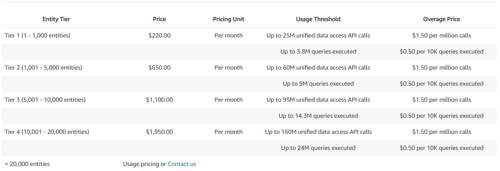

In [11]:
image3 = "/content/Pricing.jpg"
image3 = Image.open(image3)
#
thumb = image3.copy()
thumb.thumbnail([500, 500])
display(thumb)

In [12]:
question ="Who is the monthly pricing for Tier2 entity ?"
print(f"Answer : {process_document(image3,question)}")

A decoder-only architecture is being used, but right-padding was detected! For correct generation results, please set `padding_side='left'` when initializing the tokenizer.
/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


Answer : $650.00


## Using image path

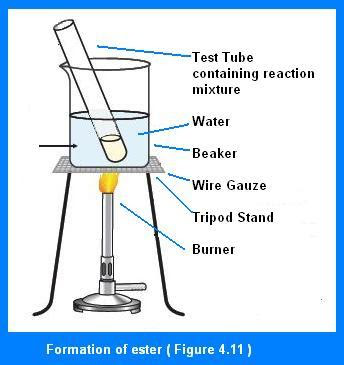

In [20]:
import requests
from PIL import Image
url = "http://1.bp.blogspot.com/-Z9cH1xdESbk/TxMPxsKlxRI/AAAAAAAAAQM/jga78TerRGY/w1200-h630-p-nu/Formation-of-ester-Carbon-and-its-Compound-CBSE-CLASS-10th-%2528Xth%2529-SCIENCE-Chapter-4.JPG"
image = Image.open(requests.get(url, stream=True).raw)
thumb = image.copy()
thumb.thumbnail([500, 500])
display(thumb)

In [21]:
question ="What is illustrated in the image ?"
print(f"Answer : {process_document(image,question)}")

A decoder-only architecture is being used, but right-padding was detected! For correct generation results, please set `padding_side='left'` when initializing the tokenizer.


Answer : Test Tube containing reaction mixture


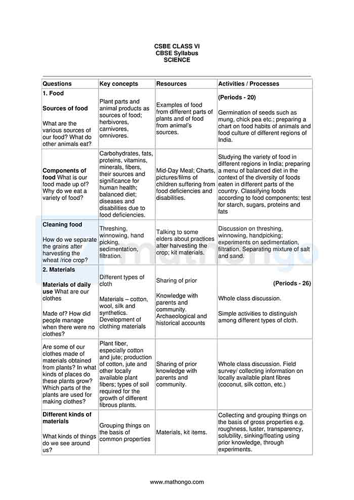

In [17]:
url1 = "https://cdn1.mathongo.com/wp-content/uploads/20191018190703/CBSE-Syllabus-Class-6-Science-1.jpg"
image = Image.open(requests.get(url1, stream=True).raw)
thumb = image.copy()
thumb.thumbnail([500, 500])
display(thumb)

In [19]:
question ="What are the key concepts for question 1 food?"
print(f"Answer : {process_document(image,question)}")

A decoder-only architecture is being used, but right-padding was detected! For correct generation results, please set `padding_side='left'` when initializing the tokenizer.


Answer : plant parts and animal products as sources of food


## Save The Models

In [22]:
processor.save_pretrained("docvqa_large_processor")

In [23]:
model.save_pretrained("docvqa_large_model")

## Input file

In [25]:
%%writefile input.txt
https://cdn1.mathongo.com/wp-content/uploads/20191018190703/CBSE-Syllabus-Class-6-Science-1.jpg<<sep>>What are the key concepts for question 1 food?

Writing input.txt


## Inference Script

In [24]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
import shutil
dest_path = "/content/drive/MyDrive/Pix2Struct/model_files"
shutil.move("/content/docvqa_large_model",dest_path)

'/content/drive/MyDrive/Pix2Struct/model_files/docvqa_large_model'

In [ ]:
shutil.move("/content/docvqa_large_processor",dest_path)

'/content/drive/MyDrive/Pix2Struct/model_files/docvqa_large_processor'

In [1]:
from transformers import Pix2StructForConditionalGeneration, Pix2StructProcessor
import json
import os
import requests
from PIL import Image
import torch

#
def process_document(image, processor,model,question,device):
    # image = Image.open(image)
    inputs = processor(images=image, text=question, return_tensors="pt").to(device)
    predictions = model.generate(**inputs)
    return processor.decode(predictions[0], skip_special_tokens=True)
#
def preprocess_function(input_path, content_type=None): 
  
    with open(input_path,"r",encoding='utf-8') as f:
        data = f.read()
    print(data)
    image_url, question = data.split("<<sep>>",1)
    #data = text_path.read().decode("utf-8")
    return (image_url,question)

#
#
def predict_function(context, model_path):
    device = "gpu" if torch.cuda.is_available() else "cpu"
    model,processor = model_path
    image_url,question = context
    image = Image.open(requests.get(image_url, stream=True).raw)
    answer = process_document(image,processor,model,question,device)
    return answer

#
def model_load_function(model_path):
    device = "gpu" if torch.cuda.is_available() else "cpu"
    model_pth = os.path.join(model_path,"docvqa_large_model")
    processor_path = os.path.join(model_path,"docvqa_large_processor")
    model = Pix2StructForConditionalGeneration.from_pretrained(model_pth).to(device)
    processor = Pix2StructProcessor.from_pretrained(processor_path)

    return (model,processor)


#
def postprocess_function(predictions, content_type=None):
  return json.dumps({"response": predictions})



if __name__ == '__main__':
    audio_path = "/content/input.txt"
    data= preprocess_function(audio_path)
    model_path = "/content/drive/MyDrive/Pix2Struct/model_files"
    path = model_load_function(model_path)
    predictions = predict_function(data,path)
    out = postprocess_function(predictions)
    print(out)

https://cdn1.mathongo.com/wp-content/uploads/20191018190703/CBSE-Syllabus-Class-6-Science-1.jpg<<sep>>What are the key concepts for question 1 food?



NameError: ignored

In [4]:
#
def process_document(image, processor,model,question,device):
    # image = Image.open(image)
    inputs = processor(images=image, text=question, return_tensors="pt").to(device)
    predictions = model.generate(**inputs)
    return processor.decode(predictions[0], skip_special_tokens=True)
#
def predict_function(context, model_path):
    device = "gpu" if torch.cuda.is_available() else "cpu"
    model,processor = model_path
    image_url,question = context
    image = Image.open(requests.get(image_url, stream=True).raw)
    answer = process_document(image,processor,model, question,device)
    return answer
predictions = predict_function(data,path)

A decoder-only architecture is being used, but right-padding was detected! For correct generation results, please set `padding_side='left'` when initializing the tokenizer.
/usr/local/lib/python3.9/dist-packages/transformers/generation/utils.py:1313: UserWarning: Using `max_length`'s default (20) to control the generation length. This behaviour is deprecated and will be removed from the config in v5 of Transformers -- we recommend using `max_new_tokens` to control the maximum length of the generation.
  warnings.warn(


In [5]:
def postprocess_function(predictions, content_type=None):
  return json.dumps({"response": predictions})
#
out = postprocess_function(predictions)
print(out)

{"response": "plant parts and animal products as sources of food"}
